<div class="alert alert-block alert-danger">
 <b>2 - NUCLEI PREPROCESSING</b> 
    
**Author**: Diogo Fróis Vieira
</div>

### <center><font color='grey'>Imports</font></center>

In [2]:
# Math, image processing and other useful libraries
from __future__ import print_function, unicode_literals, absolute_import, division
import os

import pandas as pd
import numpy as np
import cv2
from collections import OrderedDict
import copy
import math
import pickle
from matplotlib.ticker import MaxNLocator
from itertools import combinations

# Image processing
from skimage.measure import regionprops
from skimage.filters import meijering, sato, frangi, hessian, threshold_otsu
from skimage.morphology import extrema, skeletonize
from skimage.transform import probabilistic_hough_line
from skimage.draw import disk, circle_perimeter
from scipy.ndimage import gaussian_filter, grey_closing
from scipy.spatial import distance_matrix
from skimage import data, restoration, util
from roipoly import RoiPoly
from matplotlib_scalebar.scalebar import ScaleBar
from biosppy.signals import tools
from biosppy.stats import pearson_correlation
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# Plotting
import matplotlib.pyplot as plt
import matplotlib.cm as pltc
import matplotlib.colors as colors
import seaborn as sns

# Widgets
import ipywidgets as widgets
from ipywidgets import interact, interactive, fixed, interact_manual
from IPython.display import display

# Graph
import sknw
import networkx as nx
from scipy.signal import argrelextrema

# 
from skan import Skeleton, summarize,draw
from skan.csr import skeleton_to_csgraph, sholl_analysis,make_degree_image
import scipy as sp
import scipy.sparse
from matplotlib.patches import Circle
from framework.Functions import cv2toski,pylsdtoski,polar_to_cartesian, remove_not1D, quantitative_analysis,hist_bin,hist_lim,branch,graphAnalysis
from framework.importing import *
from framework.preprocessingCYTO import *
#from framework.PreProcessingNUCL import excludeborder, nuclei_preprocessing, df_nuclei_preprocessing, nuclei_segmentation
from framework.processing import *
from framework.visualization import *
from framework.analysis import plot_barplot
from framework.processing_LSF import *
from framework.processing_DCF import *
from framework.processing_CNF import *
print('📚 All libraries successfully imported 📚')

📚 All libraries successfully imported 📚


In [3]:
### DATASET #1 (2D)
folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\Set 1-a-tubulin_Sofia"
options   = ["CYTO","NUCL"]
denominator = label_tubulin

### DATASET #2 (3D)
# folder      = os.path.dirname(os.getcwd()) + "\\Datasets\\Set 3D"
# options     = ["CYTO3D","NUCL3D"]
# denominator = label_tubulin3D

### DATASET #3 (Soraia)
# folder      = os.path.dirname(os.getcwd()) + "\\Datasets\\Soraia"
# options     = ["CYTO","NUCL"]
# denominator = label_soraia

### DATASET #4 (Inês)
# folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\Ines"
#options     = []
# denominator  =

### DATASET #4 (SPOCC)
# folder      = os.path.dirname(os.getcwd()) + "\\Datasets\\SPOCC2022"
# options     = ["CYTO"]
# denominator = label_SPOCC

### DATASET #6 (Nuno & Pedro)
# folder    = os.path.dirname(os.getcwd()) + "\\Datasets\\MCF-MDA"
# options     = ["CYTO","NUCL"]
# denominator  = label_MCFMDA

data = init_import(folder,options,denominator)

>>> [CYTO] added.
>>> [NUCL] added.


In [4]:
data['NUCL']

,Path,Name,Label,Image,Resolution
11,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_11_6IF_CHO_L_w3z_decon_ch00_PS.tif,WT,"[[24256, 11690, 2358, 272, 36, 0, 0, 0, 22, 56...","(1, 138.888889, 138.888889)"
16,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_16_IF6_CHO_L-W1_Z_decon_ch00_PS.tif,Mock,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(1, 138.888889, 138.888889)"
18,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_18_IF6_CHO_L-W1_Z_decon_ch00_PS.tif,Mock,"[[2960, 5244, 5720, 4710, 3874, 2326, 1264, 83...","(1, 138.888889, 138.888889)"
20,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_20_IF6_CHO_L-W1_Z_decon_ch00_PS.tif,Mock,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(1, 138.888889, 138.888889)"
30,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_30_IF6_CHO_L-W3_Z_decon_ch00_PS.tif,WT,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(1, 138.888889, 138.888889)"
34,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_34_IF6_CHO_L-W5_Z_decon_ch00_PS.tif,No transfection,"[[22690, 23518, 29976, 36203, 33621, 34527, 47...","(1, 138.888889, 138.888889)"
36,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_36_IF6_CHO_L-W5_Z_decon_ch00_PS.tif,No transfection,"[[646, 250, 78, 36, 78, 112, 92, 56, 22, 22, 0...","(1, 138.888889, 138.888889)"
38,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_38_IF6_CHO_L-W5_Z_decon_ch00_PS.tif,No transfection,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(1, 138.888889, 138.888889)"
40,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_40_IF6_CHO_L-W6_Z_decon_ch00_PS.tif,Del38_46,"[[714, 180, 56, 92, 92, 36, 56, 92, 146, 360, ...","(1, 138.888889, 138.888889)"
42,C:\Users\diogo\OneDrive - Universidade de Lisb...,MAX_42_IF6_CHO_L-W6_Z_decon_ch00_PS.tif,Del38_46,"[[15246, 14088, 14530, 14028, 13142, 9666, 672...","(1, 138.888889, 138.888889)"


# <font color='red'>Nuclei Segmentation</font>

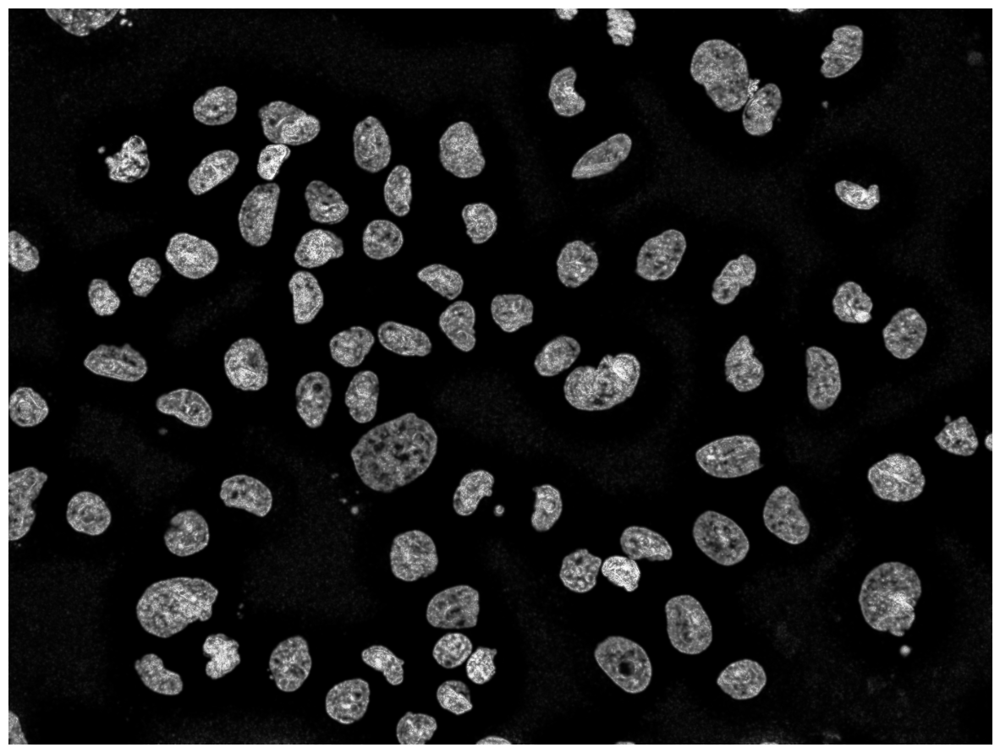

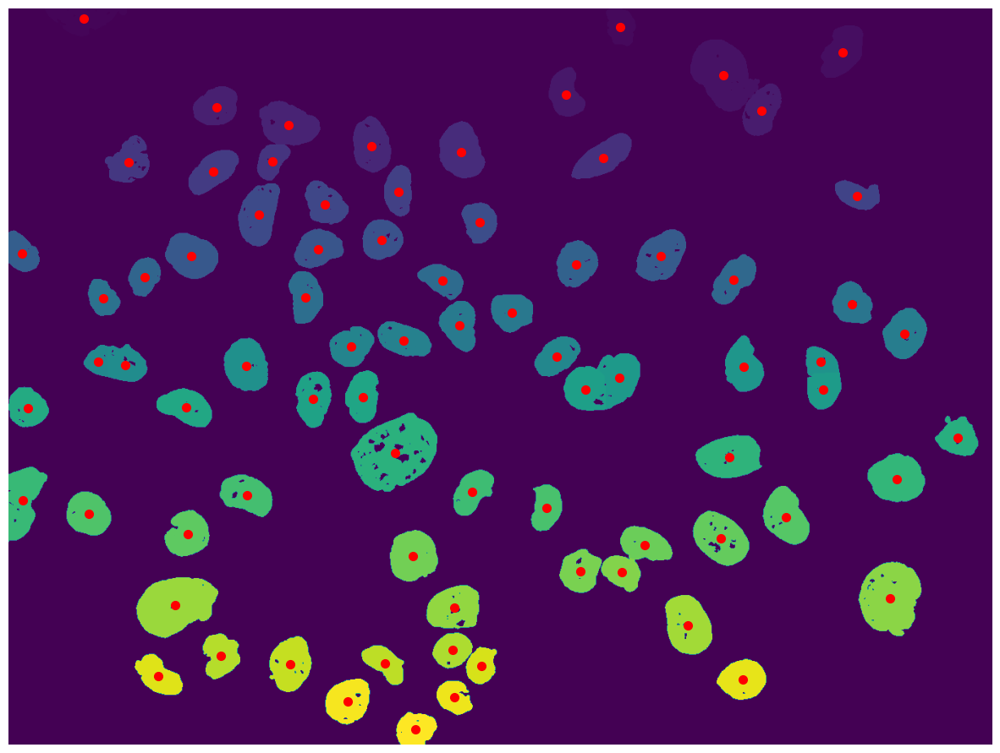

In [24]:
idx = data["NUCL"].index[2]

nuclei_segmentation(rowNUCL         = data["NUCL"].loc[idx],
                    algorithm       = "contour",
                    algorithm_specs = [0.7,300],
                    plot            = True,
                    save            = os.path.join(folder,"NUCL_PRE","Masks"))

In [55]:
def nuclei_preprocessing(rowNUCL,dir_masks,plot,save):
    from tifffile import imread
    from skimage.morphology import binary_dilation,ball,disk
    global NUCL_PRE,contour
    
    idx   = rowNUCL.name
    name  = rowNUCL['Name']
    image = rowNUCL['Image']
    label = rowNUCL['Label']
    
    if len(image.shape) == 2:
        dim = 2
    elif len(image.shape) == 3 and name.split('_')[-1] == 'ch00.tif':
        dim = 3
    else:
        print(">>>>>> PREPROCESSING: Image " + str(name) + " error.")
        return NUCL_PRE
    
    print(">>>>>> PREPROCESSING: Image " + str(name))

    path = dir_masks + str("\\") + name
    nuc_mask = imread(path)
    print(path)
#     if dim == 2:
#         try:
#             idx = name.split('_')[1] # DATASET SORAIA
#             #idx = path.split('/')[1].split('_')[1]
#         except:
#             idx = path.split('/')[-1].split('_')[2]
#     if dim == 3:
#         #idx = path.split('/')[1].split('_')[0]
#         idx = path.split('\\')[-1].split('_')[0]
        
     
    # Open figure
    if plot:
        if dim == 2:
            fig,ax = plt.subplots(figsize=(8,8))
            plt.axis('off')
            plt.imshow(nuc_mask,cmap='gray')
          
                                      
    # Obtain isolated nucleus
    nuc = 0
    
    for nucleus in np.unique(nuc_mask)[1:]:
        # Obtain isolated nucleus
        aux  = nuc_mask == nucleus
        mask_w_id = aux*nuc_mask
        bin_nuclei = np.where(mask_w_id>0.5, 1, 0) 



        # Get contour
        if dim == 2:
            contour, hierarchy = cv2.findContours((bin_nuclei*255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            #dil = binary_dilation(bin_nuclei,footprint=disk(3))
        if dim == 3:
            contour = 0
            dil = binary_dilation(bin_nuclei,footprint=ball(3))
        

        imgg = bin_nuclei * (image / np.max(image))
        imgg = imgg / np.max(imgg)


        if dim == 2:
            xp,yp  = np.where(bin_nuclei>0)
#             imgg   = imgg[min(xp):max(xp),min(yp):max(yp)]
            pixels = [xp,yp]

        if dim == 3:
            xp,yp,zp = np.where(dil>0)
            #print(min(xp),max(xp),min(yp),max(yp),min(zp),max(zp))
            #imgg     = imgg[min(xp):max(xp),min(yp):max(yp),min(zp):max(zp)]
            pixels   = [xp,yp,zp]

        imgg = (imgg *255).astype(np.uint8)
        #print(imgg.shape,np.unique(imgg))
        props = regionprops((imgg!=0)*1, imgg)


        if dim == 2:
            #cent = round(props[0].centroid[0] + min(xp),3), round(props[0].centroid[1] + min(yp),3)
            cent = round(props[0].centroid[0],3), round(props[0].centroid[1],3)
        if dim == 3:
            #cent = round(props[0].centroid[2] + min(zp),3), round(props[0].centroid[0] + min(xp),3), round(props[0].centroid[1] + min(yp),3)
            cent = props[0].centroid[0], props[0].centroid[1], props[0].centroid[2]


        # Add to dataframe
        global new
        if 'NUCL_PRE' not in globals():
            NUCL_PRE = pd.DataFrame(columns = ['Img Index'] + ['Label'] + ['Nucleus Mask'] + ['Centroid'] + ['Contour']) 
        new   = pd.Series([idx] + [label] + [pixels] + [cent] + [contour[0]],index=NUCL_PRE.columns)
        NUCL_PRE = pd.concat([NUCL_PRE,new.to_frame().T],axis=0,ignore_index=True)
        
        
        # Plot
        if plot:
            if dim == 2:
                #plt.plot(cent[1] + min(yp),cent[0] + min(xp),'o',color='red',markersize=7)
                plt.plot(cent[1],cent[0],'o',color='red',markersize=7)
                
                cr = contour[0].reshape((contour[0].shape[0],contour[0].shape[2]))
                ax.plot(cr[:,0],cr[:,1],'--',color='#6495ED',zorder=11,linewidth=3)
#                 if dim == 3:
#                     test = label2rgb(nuc_mask, image=image, bg_label=0)
#                     sl = 1
#                     for im in test:
#                         plt.figure(figsize=(15,15))
#                         plt.axis('off')
#                         plt.imshow(im)
#                         plt.plot(cent[1],cent[0],'o',color='red',markersize=7)
#                         #plt.savefig("..//tempp//id70_slice" + str(sl) + ".png",format='png',transparent=True,bbox_inches='tight',dpi=200)
#                         plt.show()  
#                         sl += 1



        # Print progress
        nuc += 1
        print('>>> Preprocessing: ' + str(100*nuc / len(np.unique(nuc_mask))))
            
    if plot and dim == 3:
        test = label2rgb(nuc_mask, image=image, bg_label=0)
        dat = NUCL_PRE[NUCL_PRE['Img Index'] == int(idx)]
        sl = 1
        for im in test:
            plt.figure(figsize=(15,15))
            plt.axis('off')
            plt.imshow(im)
            for centr in dat['Centroid']:
                plt.plot(centr[2],centr[1],'o',color='red',markersize=7,zorder=10)
            #plt.savefig("..//tempp//id70_slice" + str(sl) + ".png",format='png',transparent=True,bbox_inches='tight',dpi=200)
            plt.show()  
            sl += 1 
    
    # Save figure
    if plot:
        if save != False:
            plt.savefig(os.getcwd() + str("\\Datasets\\") + str(name) + ".png",format='png',transparent=True,bbox_inches='tight',dpi=500)
        plt.show()
        
#         sl = 1
#         for im in test:
#             plt.figure(figsize=(15,15))
#             plt.axis('off')
#             plt.imshow(im)
#             #plt.savefig("..//tempp//id70_slice" + str(sl) + ".png",format='png',transparent=True,bbox_inches='tight',dpi=200)
#             plt.show()  
#             sl += 1
        
        
    return NUCL_PRE

>>>>>> PREPROCESSING: Image MAX_18_IF6_CHO_L-W1_Z_decon_ch00_PS.tif
C:\Users\diogo\OneDrive - Universidade de Lisboa\Ambiente de Trabalho\CYSK_Workspace\Datasets\Set 1-a-tubulin_Sofia\NUCL_PRE\Masks\MAX_18_IF6_CHO_L-W1_Z_decon_ch00_PS.tif
>>> Preprocessing: 1.25
>>> Preprocessing: 2.5
>>> Preprocessing: 3.75
>>> Preprocessing: 5.0
>>> Preprocessing: 6.25
>>> Preprocessing: 7.5
>>> Preprocessing: 8.75
>>> Preprocessing: 10.0
>>> Preprocessing: 11.25
>>> Preprocessing: 12.5
>>> Preprocessing: 13.75
>>> Preprocessing: 15.0
>>> Preprocessing: 16.25
>>> Preprocessing: 17.5
>>> Preprocessing: 18.75
>>> Preprocessing: 20.0
>>> Preprocessing: 21.25
>>> Preprocessing: 22.5
>>> Preprocessing: 23.75
>>> Preprocessing: 25.0
>>> Preprocessing: 26.25
>>> Preprocessing: 27.5
>>> Preprocessing: 28.75
>>> Preprocessing: 30.0
>>> Preprocessing: 31.25
>>> Preprocessing: 32.5
>>> Preprocessing: 33.75
>>> Preprocessing: 35.0
>>> Preprocessing: 36.25
>>> Preprocessing: 37.5
>>> Preprocessing: 38.75
>>> Prep

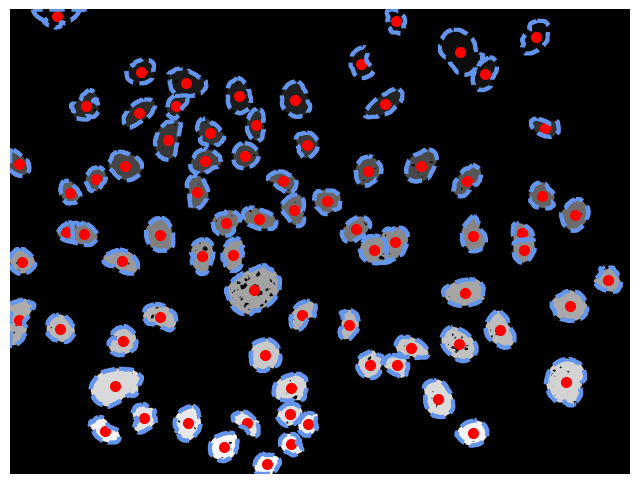

,Img Index,Label,Nucleus Mask,Centroid,Contour
0,"Index(['Path', 'Name', 'Label', 'Image', 'Reso...",Mock,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(14.426, 105.544)","([[[51 0]], [[51 1]], [[51 2]], [[52 3]], ..."
1,"Index(['Path', 'Name', 'Label', 'Image', 'Reso...",Mock,"[[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,...","(25.753, 863.318)","([[[848 0]], [[847 1]], [[846 2]], [[845..."
2,"Index(['Path', 'Name', 'Label', 'Image', 'Reso...",Mock,"[[25, 25, 25, 25, 25, 25, 25, 25, 25, 25, 25, ...","(61.295, 1176.176)","([[[1179 25]], [[1178 26]], [[1177 26]],..."
3,"Index(['Path', 'Name', 'Label', 'Image', 'Reso...",Mock,"[[45, 45, 45, 45, 45, 45, 45, 45, 45, 45, 45, ...","(93.919, 1007.962)","([[[989 45]], [[988 46]], [[987 46]], [[986..."
4,"Index(['Path', 'Name', 'Label', 'Image', 'Reso...",Mock,"[[84, 84, 84, 84, 84, 84, 84, 85, 85, 85, 85, ...","(121.072, 785.75)","([[[788 84]], [[787 85]], [[786 85]], [[785..."
...,...,...,...,...,...
236,18,Mock,"[[912, 912, 912, 912, 912, 912, 912, 912, 913,...","(942.771, 211.182)","[[[198, 912]], [[197, 913]], [[196, 913]], [[1..."
237,18,Mock,"[[919, 919, 919, 919, 919, 920, 920, 920, 920,...","(947.769, 1035.317)","[[[1038, 919]], [[1037, 920]], [[1036, 920]], ..."
238,18,Mock,"[[950, 950, 950, 950, 950, 950, 950, 950, 950,...","(973.048, 628.353)","[[[618, 950]], [[617, 951]], [[616, 951]], [[6..."
239,18,Mock,"[[947, 947, 947, 947, 947, 947, 947, 947, 947,...","(978.034, 478.559)","[[[489, 947]], [[488, 948]], [[487, 948]], [[4..."


In [56]:
idx = data["NUCL"].index[2]


nuclei_preprocessing(rowNUCL   = data['NUCL'].loc[idx],
                     dir_masks = os.path.join(folder,"NUCL_PRE","Masks"),
                     plot      = True,
                     save      = False)

In [3]:
# import image
from tifffile import imread, imwrite
from stardist.models import StarDist3D
from csbdeep.utils import Path, normalize
from stardist.geometry import dist_to_coord3D
import napari
image = imread(os.getcwd() + "\\Datasets\\10Z\\11_6IF_CHO_L_w3z_decon_ch00.tif" )

# import model
model = StarDist3D.from_pretrained('3D_demo')

# normalize image
img = normalize(image, 1,99.8, axis=(0,1,2))

# predict segmentation
labels, details = model.predict_instances(img)

# calculate 3d coordinates from rays and distances
coord = dist_to_coord3D(details['dist'], details['points'], details['rays_vertices'])

# create list of colors to use randomly use for objects
colormaps = ['yellow', 'green', 'red','blue','cyan','magenta']
colors = np.random.choice(colormaps, len(coord))

# create napari viewer
viewer = napari.Viewer(ndisplay=3)
viewer.add_image(image, blending = 'additive')
for i in range(len(coord)):
    # plot each object as a surface object
    vertices = coord[i,:,:]
    faces = details['rays_faces']
    values = np.linspace(0, 1, len(vertices))
    surface = (vertices, faces, values)
    viewer.add_surface(surface, colormap=colors[i], blending = 'translucent')

Found model '3D_demo' for 'StarDist3D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.707933, nms_thresh=0.3.


  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']


In [4]:
import tifffile as tiffio
dir_masks   = os.getcwd() + '\\Datasets'
files = os.listdir(dir_masks)

path     = dir_masks + '\\' + files[1]
nuc_mask = tiffio.imread(path)

import napari

viewer = napari.view_image(nuc_mask)

  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']
  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']


In [15]:
import napari

viewer = napari.view_image(TenDF.loc[9][TenDF.loc[9]['Channel'] == 2]['Image'].values[0])

  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']
  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']
  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']
  replacements made: ['viewtransformf', 'raycasting_setup', 'before_loop', 'in_loop', 'after_loop', 'sampler_type', 'post', 'pre', 'clip_with_planes', 'cmap', 'get_data']


In [ ]:
deconvoluted_nuclei_preprocessing(image,label,thr,plot)

# <font color='red'>2.5 Plot Results</font>

In [6]:
# ---------------
dataset = NucleiDeconvDF
#dataset = OriginalDF
# ---------------

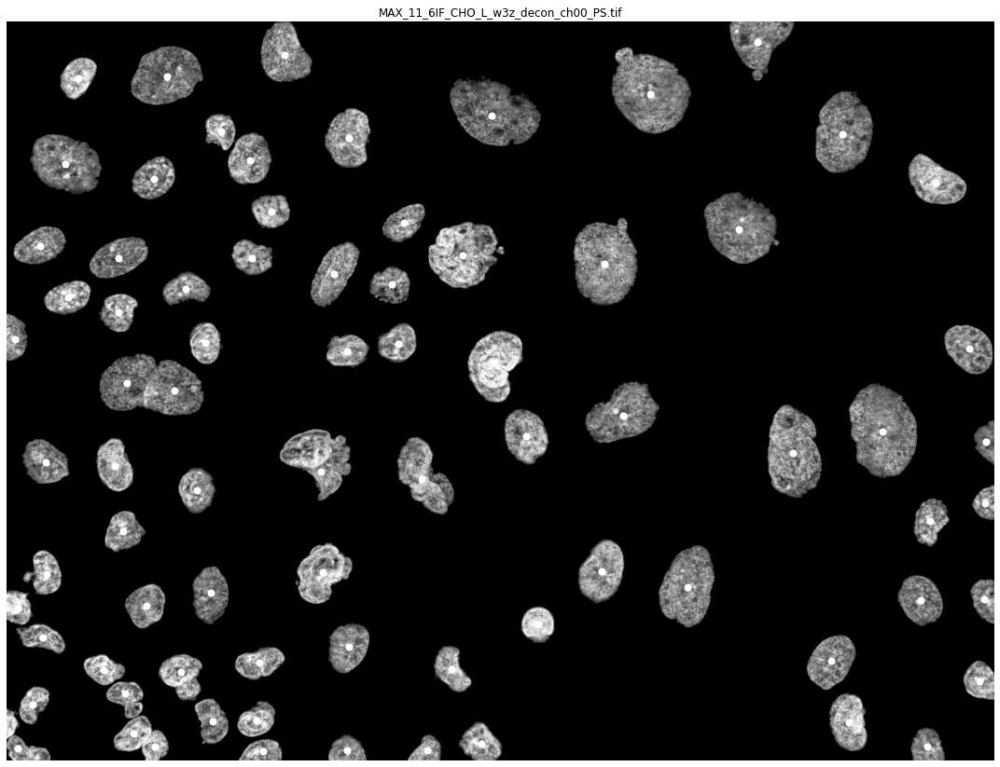

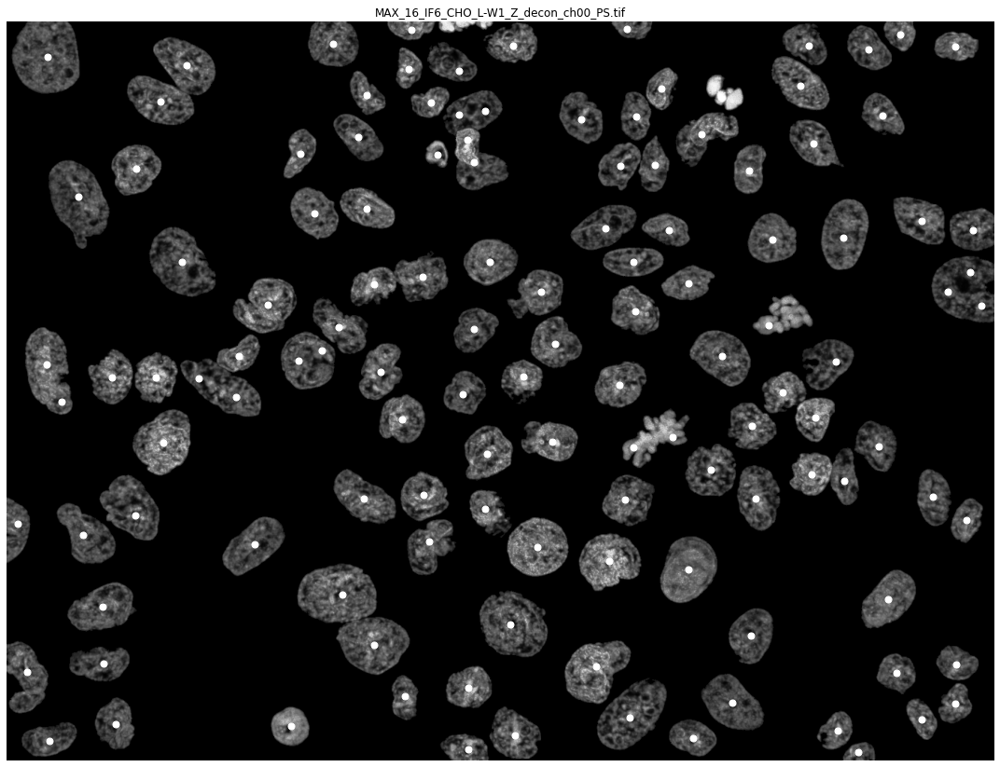

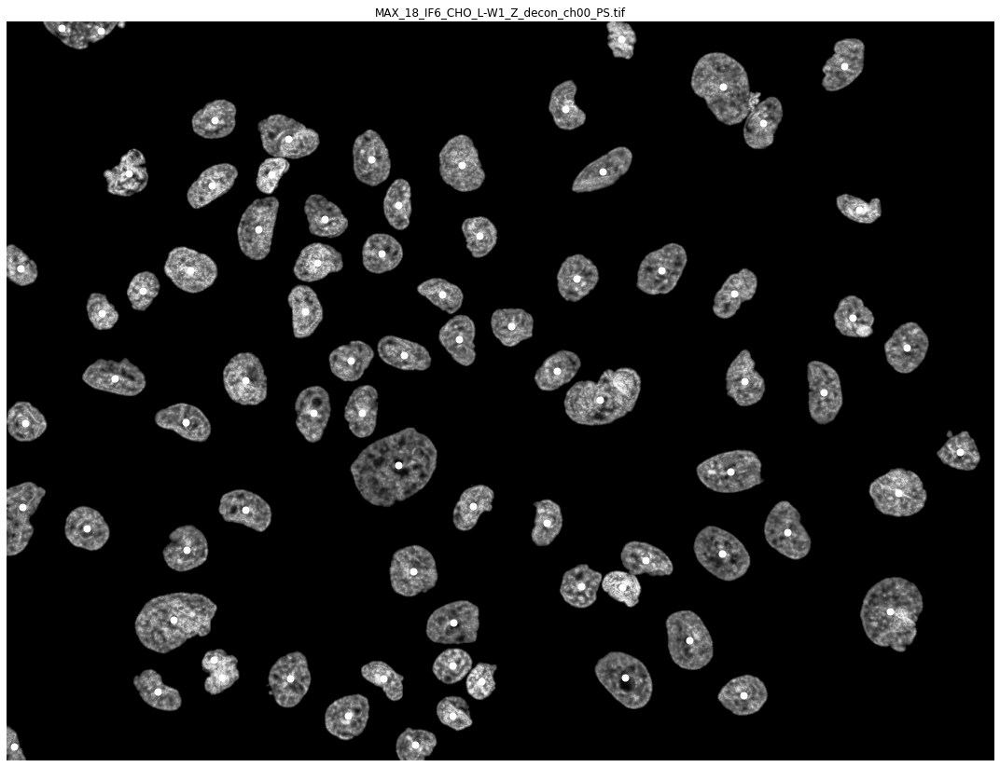

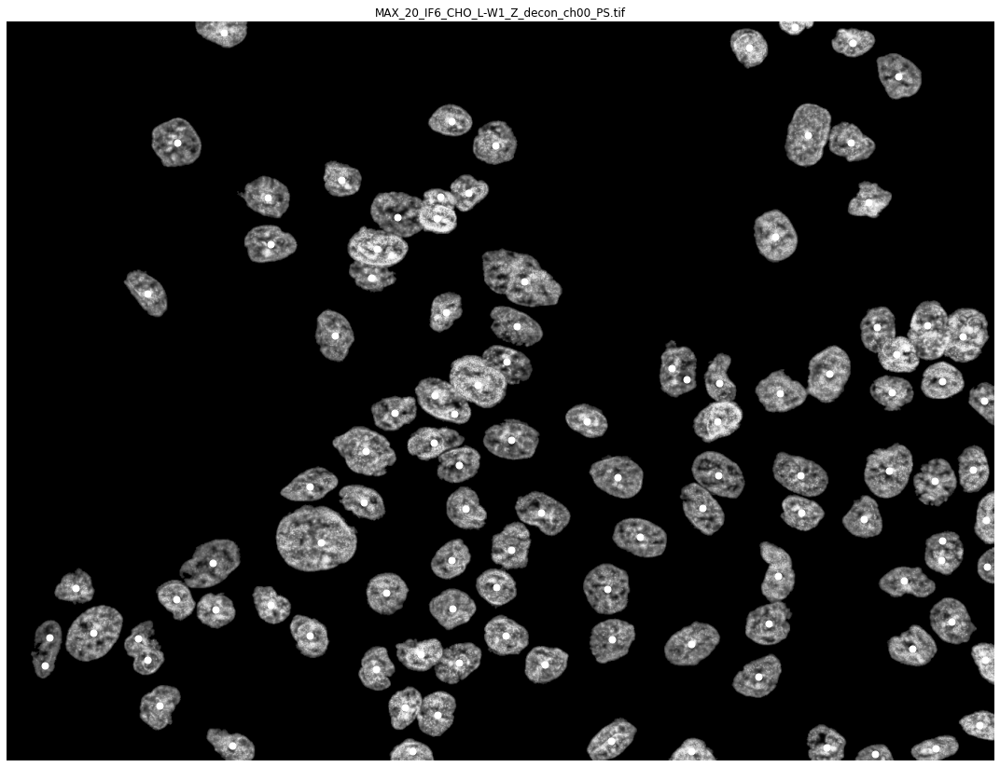

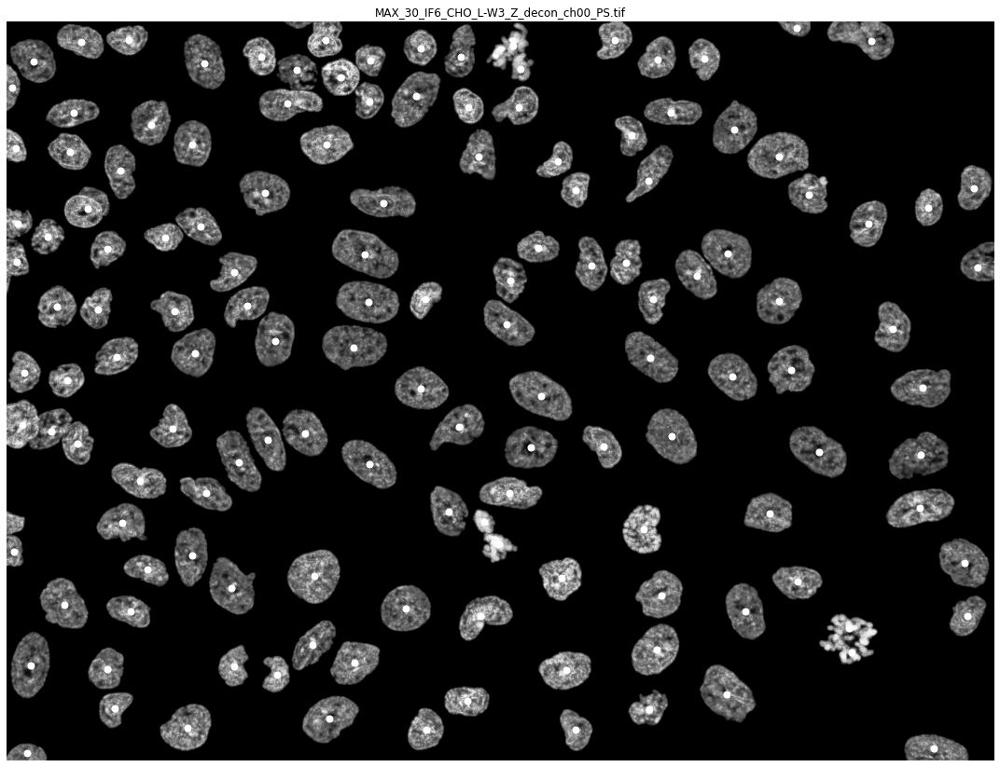

...

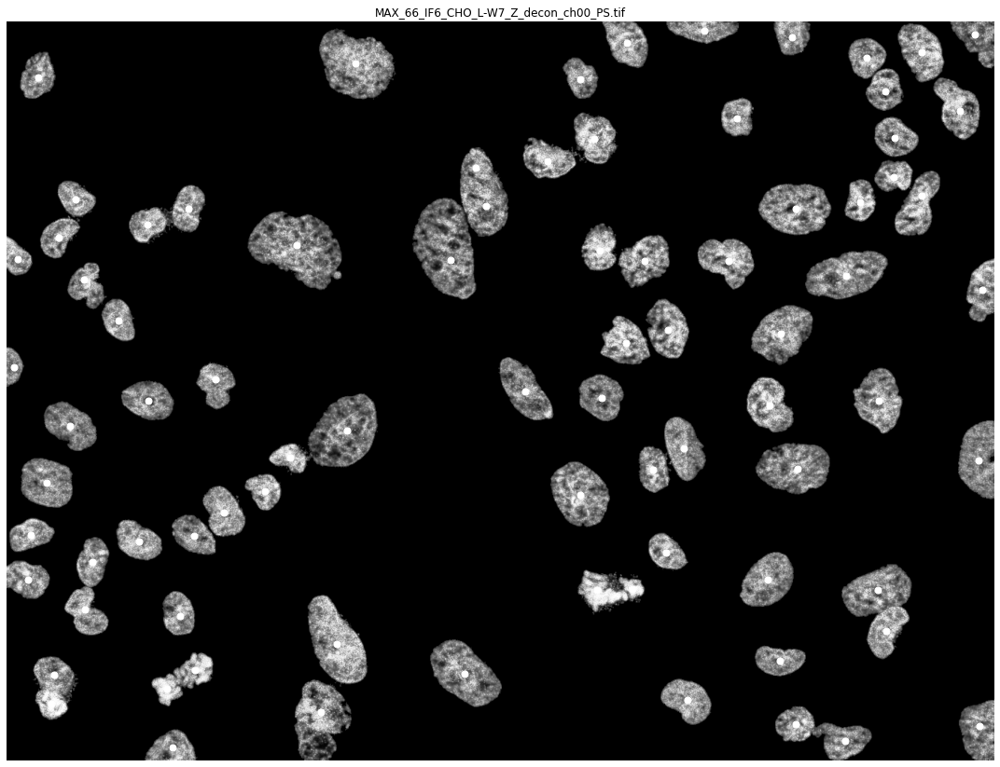

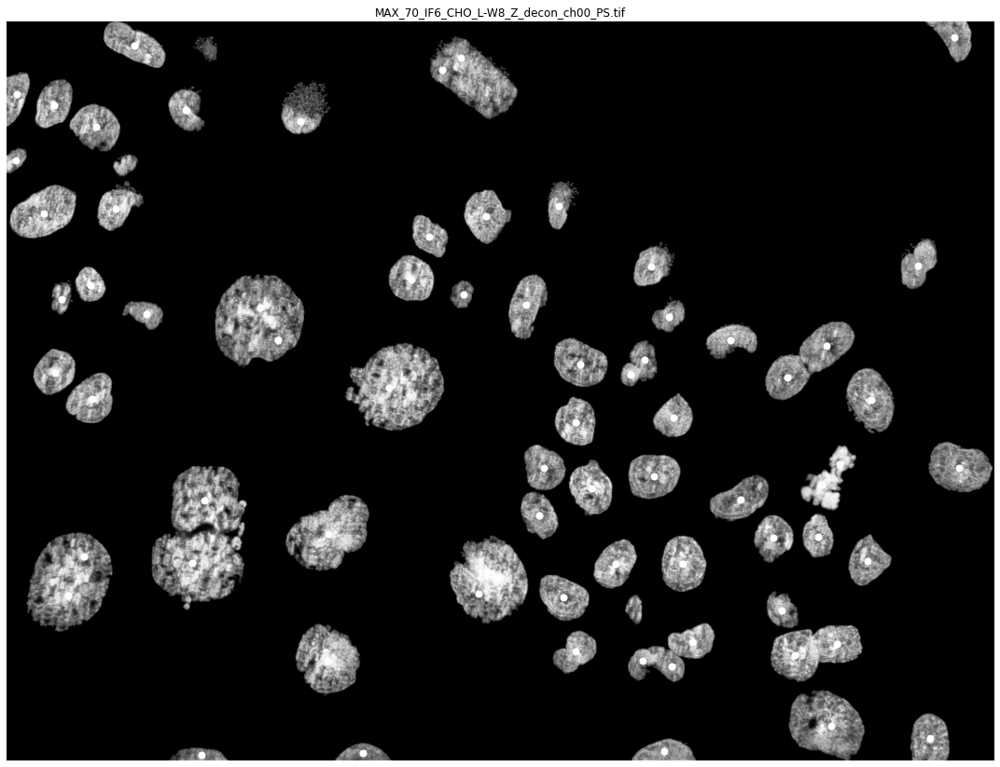

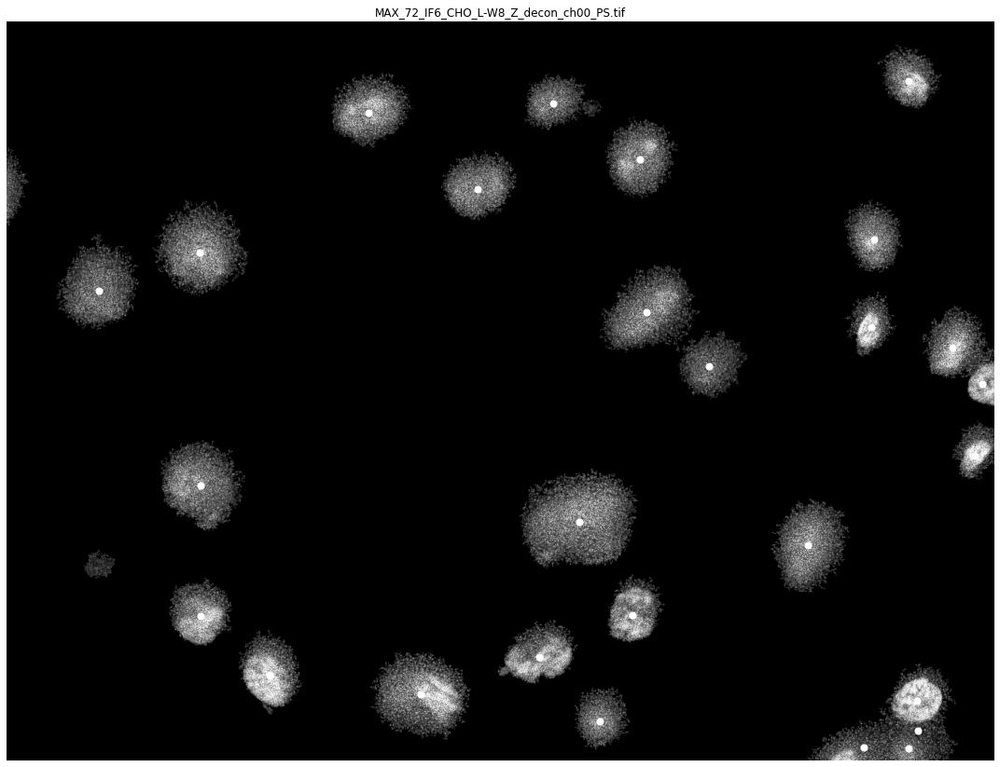

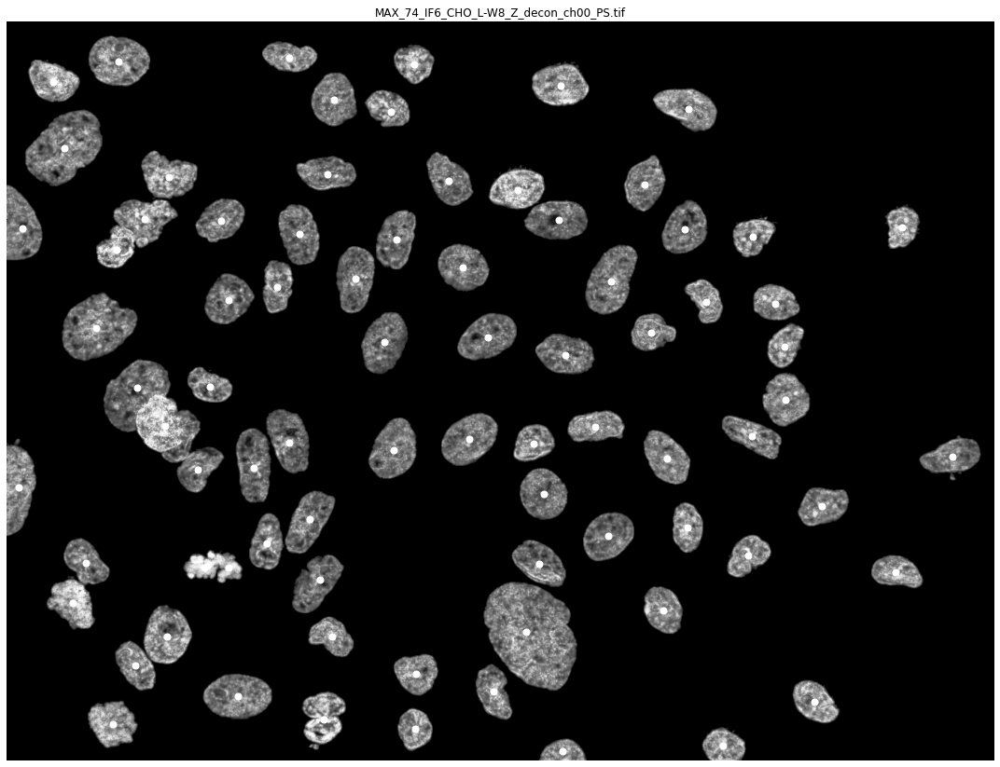

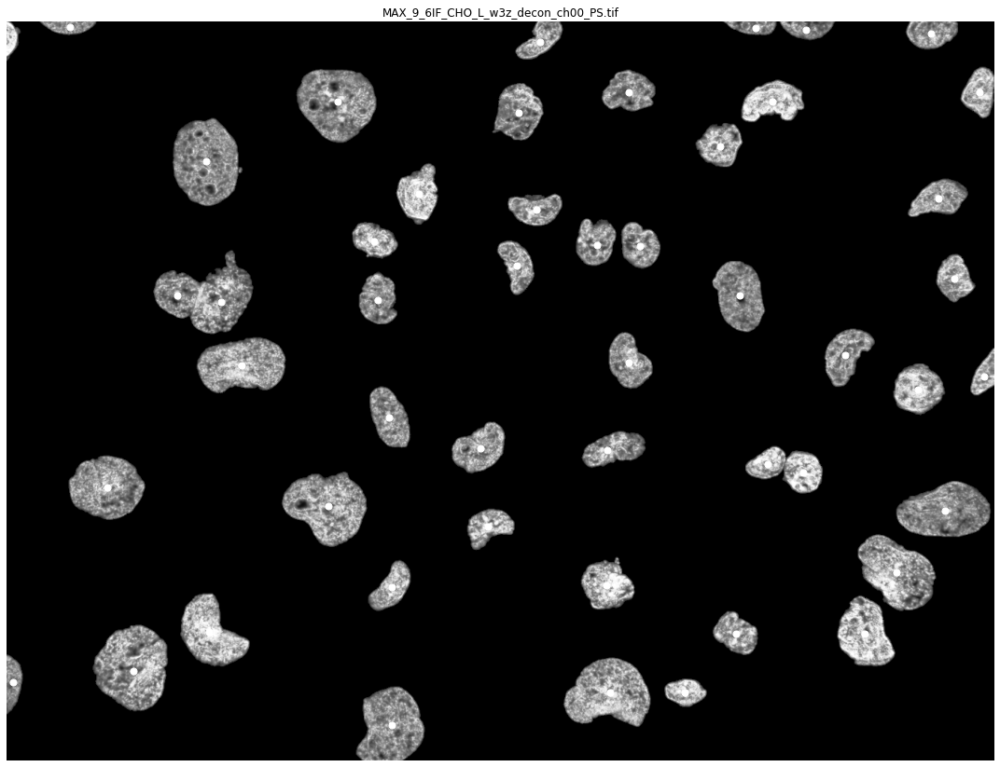

In [7]:
s = 1
%matplotlib inline
for index,row in dataset.iterrows():
    plt.figure(figsize=(15,15))
    
    # Plot Nuclei
    if len(row['Image'].shape) == 2:
        plt.imshow(row['Image'],cmap="gray")
    else:
        plt.imshow(row['Image'],cmap="gray")
    
    # Plot centroids for given image
    for index_c,row_c in Centroids[index].iterrows():
        plt.plot(row_c['Centroid'][1],row_c['Centroid'][0],'o',color='white',markersize=7)
    
    # Plot specs
    plt.axis('off')
    plt.title(row['Name'],fontsize=12)
    plt.tight_layout() 
    #plt.savefig(".//NucleiSofia//" + str("Centroids_") + str(row['Name']) +".png",format='png',transparent=True,bbox_inches='tight',dpi=200)
            
    plt.show()

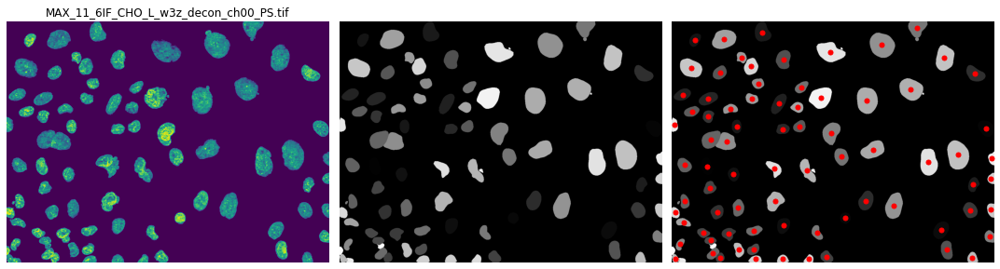

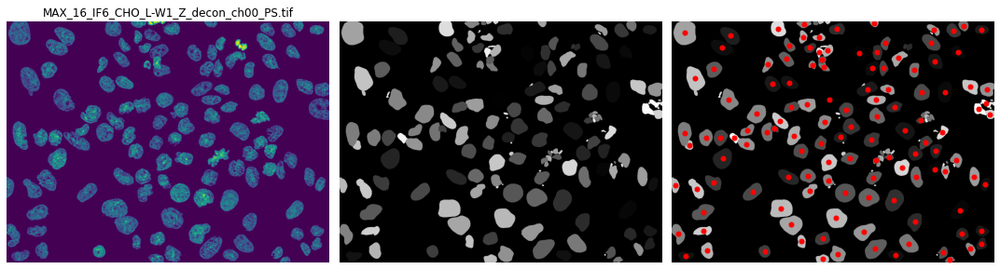

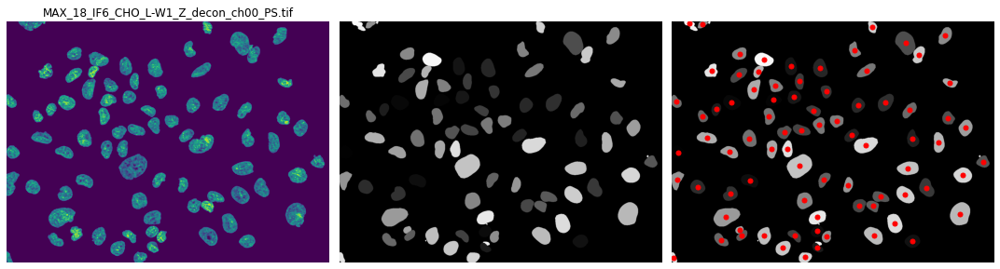

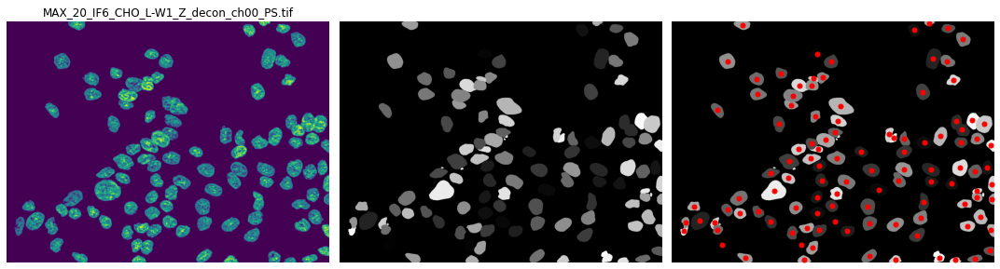

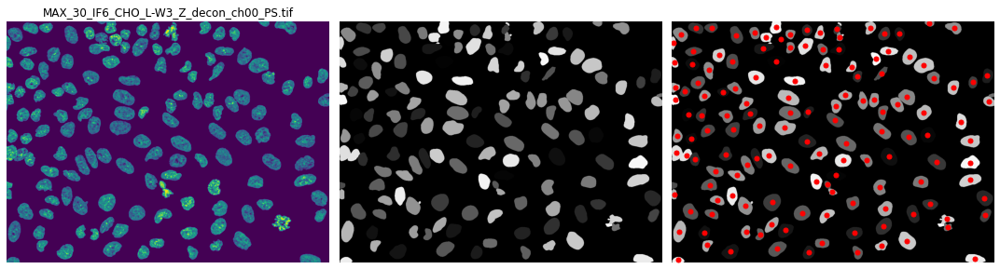

...

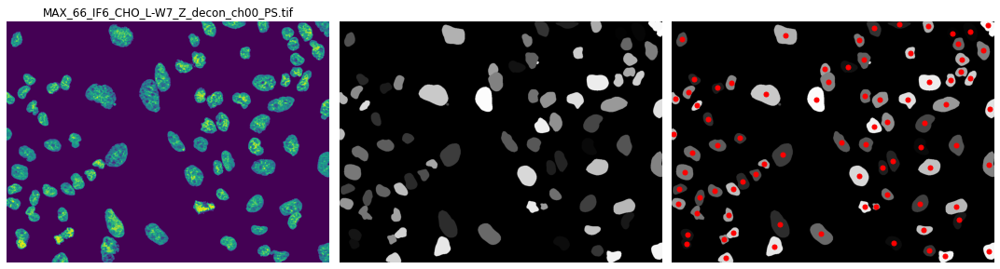

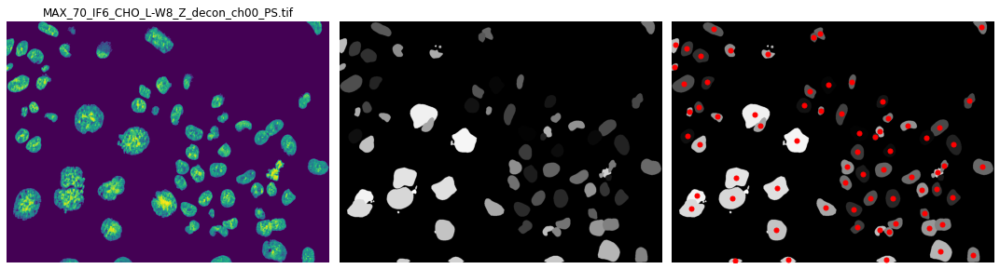

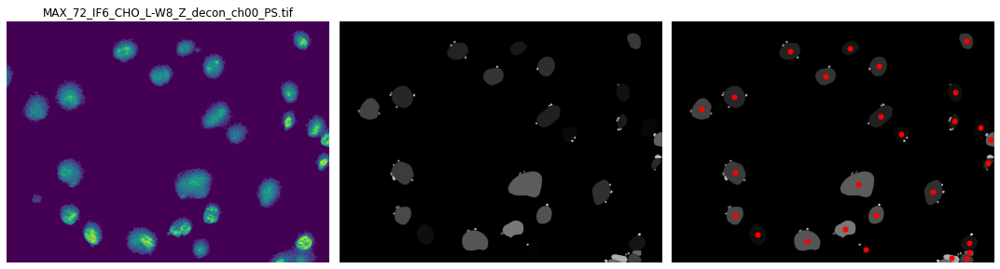

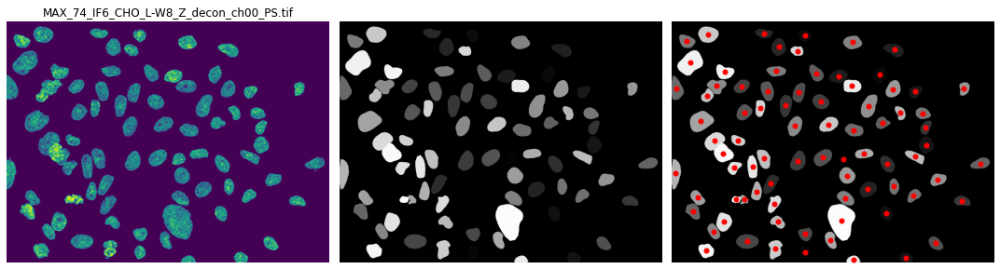

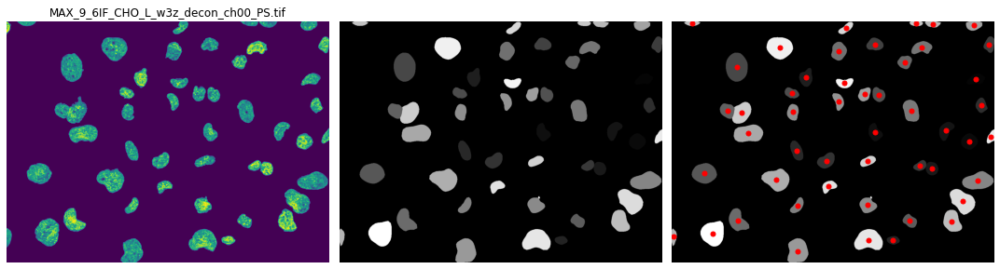

In [7]:
for index,row in NucleiDeconvDF.iterrows():
    plt.figure(figsize=(15,15))
               
    # PLOT DECONVOLUTED NUCLEI
    plt.subplot(1,3,1)
    plt.title(row['Name'])
    plt.imshow(row['Image'])
    plt.axis('off')
    plt.tight_layout()

    # PLOT MASK WITH NUCLEI ID
    plt.subplot(1,3,2)
    #path     = dir_masks + '/nuclei_' + row['Name']
    path     = dir_masks + "\\" + row['Name'] + "f"
    nuc_mask = cv2.imread(path,-1)
    plt.imshow(nuc_mask,cmap="gray")
    plt.axis('off')
    plt.tight_layout()

    # PLOT MASK WITH CENTROIDS
    plt.subplot(1,3,3)
    plt.imshow(nuc_mask,cmap="gray")
    plt.axis('off')
    for index_c,row_c in Centroids[index].iterrows():
        plt.plot(row_c['Centroid'][1],row_c['Centroid'][0],'o',color='red',markersize=5)
    plt.tight_layout()

# <font color='red'>2.5 Save Pickle</font>

In [6]:
#pickle.dump(Centroids , open('Centroids.p', 'wb'))
nucDF.to_pickle(".//nucDF_27jan.pkl")

----------